<a href="https://colab.research.google.com/github/kgreed4/parkisons_exploration/blob/main/stand_to_sit/pose_detection_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake -DBUILD_PYTHON=ON .. && make -j`nproc`

Selecting previously unselected package liblmdb0:amd64.
(Reading database ... 121752 files and directories currently installed.)
Preparing to unpack .../00-liblmdb0_0.9.24-1build2_amd64.deb ...
Unpacking liblmdb0:amd64 (0.9.24-1build2) ...
Selecting previously unselected package libgflags2.2.
Preparing to unpack .../01-libgflags2.2_2.2.2-2_amd64.deb ...
Unpacking libgflags2.2 (2.2.2-2) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../02-libgflags-dev_2.2.2-2_amd64.deb ...
Unpacking libgflags-dev (2.2.2-2) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../03-libgoogle-glog0v5_0.5.0+really0.4.0-2_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.5.0+really0.4.0-2) ...
Selecting previously unselected package libunwind-dev:amd64.
Preparing to unpack .../04-libunwind-dev_1.3.2-2build2.1_amd64.deb ...
Unpacking libunwind-dev:amd64 (1.3.2-2build2.1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to un

In [24]:
!pip install opencv-python

In [28]:
import cv2
import openpose as op  # Import the OpenPose library
# ./build/examples/openpose/openpose.bin
%cd './openpose/examples/'
!cmake ..
!make -j`sysctl -n hw.logicalcpu`

[Errno 2] No such file or directory: './openpose/examples/'
/content/openpose/examples
-- GCC detected, adding compile flags
-- GCC detected, adding compile flags
-- Building with CUDA.
-- CUDA detected: 12.2
-- Found cuDNN: ver. 8.9.6 found (include: /usr/include, library: /usr/lib/x86_64-linux-gnu/libcudnn.so)
-- Automatic GPU detection failed. Building for all known architectures.
-- Added CUDA NVCC flags for: sm_35 sm_37 sm_50 sm_52 sm_53 sm_60 sm_61 sm_62 sm_70 sm_72 sm_75 sm_80 sm_86
-- Found cuDNN: ver. 8.9.6 found (include: /usr/include, library: /usr/lib/x86_64-linux-gnu/libcudnn.so)
-- Found gflags  (include: /usr/include, library: /usr/lib/x86_64-linux-gnu/libgflags.so)
-- Found glog    (include: /usr/include, library: /usr/lib/x86_64-linux-gnu/libglog.so)
-- Caffe will be downloaded from source now. NOTE: This process might take several minutes depending
        on your internet connection.
-- Caffe has already been downloaded.
HEAD is now at 1807aada Added Ampere arch's (C

In [49]:
!pip install opencv-python
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 21.7 MB/s eta 0:00:00


landmark {
  x: 0.5204565525054932
  y: 0.34547722339630127
  z: -0.5603677034378052
  visibility: 0.9999876022338867
}
landmark {
  x: 0.5405938029289246
  y: 0.3309767544269562
  z: -0.5448979139328003
  visibility: 0.9999598264694214
}
landmark {
  x: 0.5520344972610474
  y: 0.3302815854549408
  z: -0.5449983477592468
  visibility: 0.9999622106552124
}
landmark {
  x: 0.5607844591140747
  y: 0.32952067255973816
  z: -0.5451638102531433
  visibility: 0.9999507665634155
}
landmark {
  x: 0.5052105784416199
  y: 0.3300836384296417
  z: -0.539911687374115
  visibility: 0.9999607801437378
}
landmark {
  x: 0.4945332705974579
  y: 0.3290770947933197
  z: -0.539856493473053
  visibility: 0.9999566078186035
}
landmark {
  x: 0.48525571823120117
  y: 0.32777950167655945
  z: -0.5400473475456238
  visibility: 0.9999468326568604
}
landmark {
  x: 0.5808504819869995
  y: 0.3304554224014282
  z: -0.3280479907989502
  visibility: 0.9999055862426758
}
landmark {
  x: 0.47819218039512634
  y: 0.328

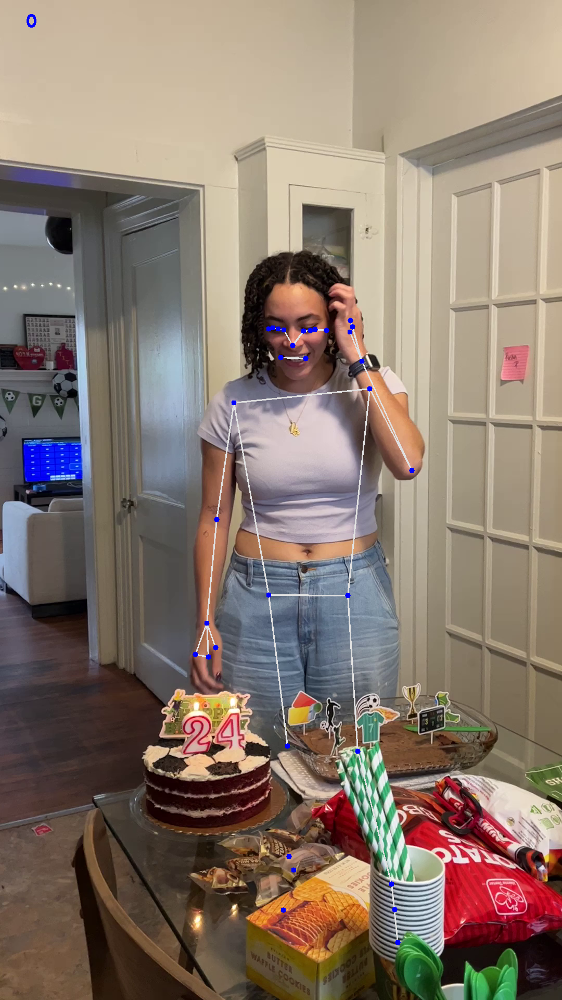

landmark {
  x: 0.5204533338546753
  y: 0.34462180733680725
  z: -0.49194908142089844
  visibility: 0.9999877214431763
}
landmark {
  x: 0.5406609773635864
  y: 0.3301500380039215
  z: -0.47725987434387207
  visibility: 0.9999602437019348
}
landmark {
  x: 0.5520815253257751
  y: 0.3294215798377991
  z: -0.4773187041282654
  visibility: 0.9999623894691467
}
landmark {
  x: 0.560824990272522
  y: 0.3285766839981079
  z: -0.4774848520755768
  visibility: 0.9999515414237976
}
landmark {
  x: 0.5054512619972229
  y: 0.32986584305763245
  z: -0.4746781587600708
  visibility: 0.9999617338180542
}
landmark {
  x: 0.49482449889183044
  y: 0.32901445031166077
  z: -0.4746401607990265
  visibility: 0.9999576210975647
}
landmark {
  x: 0.485453337430954
  y: 0.3278018832206726
  z: -0.47479337453842163
  visibility: 0.9999486804008484
}
landmark {
  x: 0.5809183716773987
  y: 0.32958346605300903
  z: -0.28262731432914734
  visibility: 0.9999068379402161
}
landmark {
  x: 0.47819191217422485
  y: 

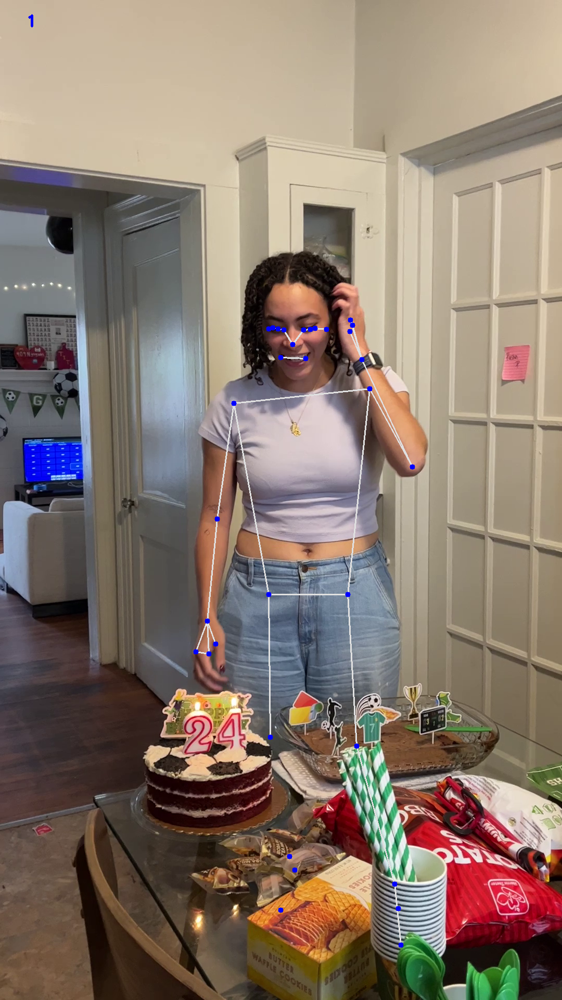

landmark {
  x: 0.5205028057098389
  y: 0.3446562588214874
  z: -0.5109350085258484
  visibility: 0.9999871850013733
}
landmark {
  x: 0.5406630635261536
  y: 0.3301534056663513
  z: -0.4964413642883301
  visibility: 0.9999587535858154
}
landmark {
  x: 0.552079439163208
  y: 0.32942327857017517
  z: -0.4965166449546814
  visibility: 0.9999604225158691
}
landmark {
  x: 0.5608129501342773
  y: 0.3285769522190094
  z: -0.4966825246810913
  visibility: 0.9999497532844543
}
landmark {
  x: 0.5054730176925659
  y: 0.3300677239894867
  z: -0.49274206161499023
  visibility: 0.9999610781669617
}
landmark {
  x: 0.4948717951774597
  y: 0.32944127917289734
  z: -0.49269917607307434
  visibility: 0.9999566674232483
}
landmark {
  x: 0.4854733943939209
  y: 0.32876530289649963
  z: -0.4928649365901947
  visibility: 0.9999485015869141
}
landmark {
  x: 0.5809489488601685
  y: 0.3294711410999298
  z: -0.28496819734573364
  visibility: 0.9999027848243713
}
landmark {
  x: 0.47819656133651733
  y: 0.

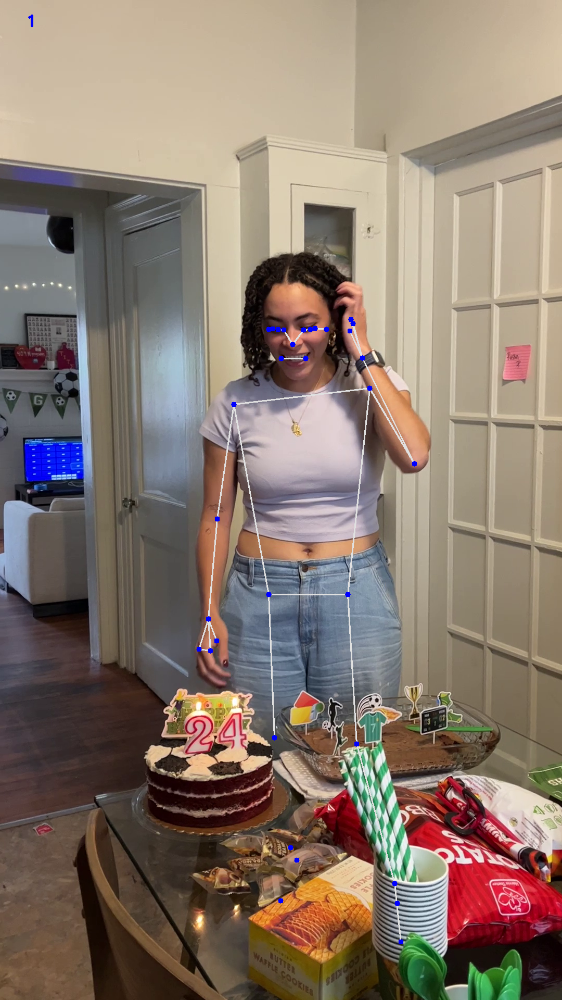

landmark {
  x: 0.5205561518669128
  y: 0.3446687161922455
  z: -0.37987586855888367
  visibility: 0.9999865889549255
}
landmark {
  x: 0.5406615138053894
  y: 0.3301328420639038
  z: -0.37003275752067566
  visibility: 0.9999547004699707
}
landmark {
  x: 0.5520702004432678
  y: 0.3294036090373993
  z: -0.3700828552246094
  visibility: 0.9999561309814453
}
landmark {
  x: 0.5607907772064209
  y: 0.32855623960494995
  z: -0.37015780806541443
  visibility: 0.9999446868896484
}
landmark {
  x: 0.5054942965507507
  y: 0.3301149904727936
  z: -0.3659159541130066
  visibility: 0.9999588131904602
}
landmark {
  x: 0.4949215352535248
  y: 0.3295581638813019
  z: -0.36590588092803955
  visibility: 0.9999545812606812
}
landmark {
  x: 0.48549363017082214
  y: 0.3290514051914215
  z: -0.36609363555908203
  visibility: 0.9999465942382812
}
landmark {
  x: 0.5809836983680725
  y: 0.3293733596801758
  z: -0.20896375179290771
  visibility: 0.9998877644538879
}
landmark {
  x: 0.4782063663005829
  y: 

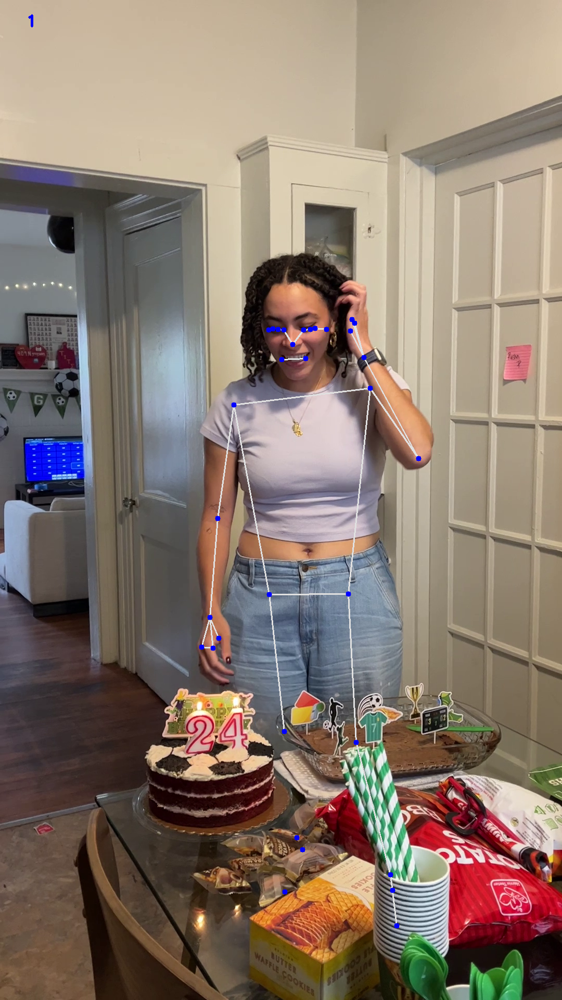

landmark {
  x: 0.520537793636322
  y: 0.3446480929851532
  z: -0.4282068908214569
  visibility: 0.999985933303833
}
landmark {
  x: 0.5405770540237427
  y: 0.3300841152667999
  z: -0.4177975356578827
  visibility: 0.999951958656311
}
landmark {
  x: 0.5520063042640686
  y: 0.3293333053588867
  z: -0.4178536832332611
  visibility: 0.9999532103538513
}
landmark {
  x: 0.5607396364212036
  y: 0.328443318605423
  z: -0.4179740846157074
  visibility: 0.9999412894248962
}
landmark {
  x: 0.5054798722267151
  y: 0.3301286995410919
  z: -0.411483496427536
  visibility: 0.9999569058418274
}
landmark {
  x: 0.4949234127998352
  y: 0.3296019434928894
  z: -0.4114714562892914
  visibility: 0.9999526143074036
}
landmark {
  x: 0.485495001077652
  y: 0.3291546404361725
  z: -0.4116534888744354
  visibility: 0.999944806098938
}
landmark {
  x: 0.5810402035713196
  y: 0.32881826162338257
  z: -0.24430815875530243
  visibility: 0.9998798966407776
}
landmark {
  x: 0.4783170819282532
  y: 0.32991605997

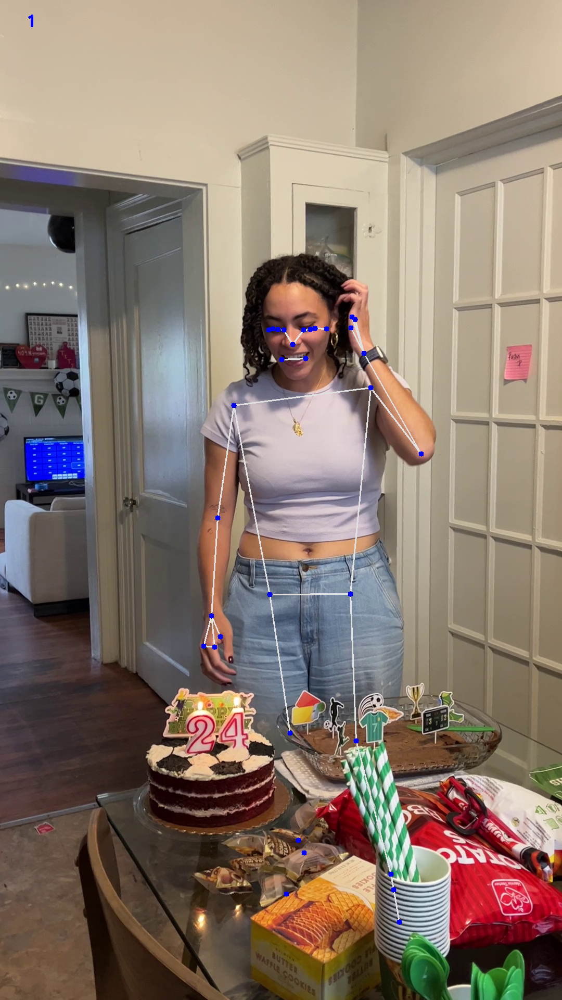

landmark {
  x: 0.5203580856323242
  y: 0.3428807854652405
  z: -0.42753633856773376
  visibility: 0.9999862909317017
}
landmark {
  x: 0.5400487780570984
  y: 0.3274421691894531
  z: -0.41727912425994873
  visibility: 0.9999525547027588
}
landmark {
  x: 0.5516576170921326
  y: 0.3265465199947357
  z: -0.4173237383365631
  visibility: 0.9999537467956543
}
landmark {
  x: 0.5604844093322754
  y: 0.3257668912410736
  z: -0.41742587089538574
  visibility: 0.9999418258666992
}
landmark {
  x: 0.505337655544281
  y: 0.32819876074790955
  z: -0.41040611267089844
  visibility: 0.9999581575393677
}
landmark {
  x: 0.4948839545249939
  y: 0.3279898464679718
  z: -0.41041889786720276
  visibility: 0.999954104423523
}
landmark {
  x: 0.4854731857776642
  y: 0.32779309153556824
  z: -0.41061484813690186
  visibility: 0.9999467134475708
}
landmark {
  x: 0.5810456871986389
  y: 0.32681673765182495
  z: -0.25365614891052246
  visibility: 0.9998792409896851
}
landmark {
  x: 0.4784011244773865
  y: 

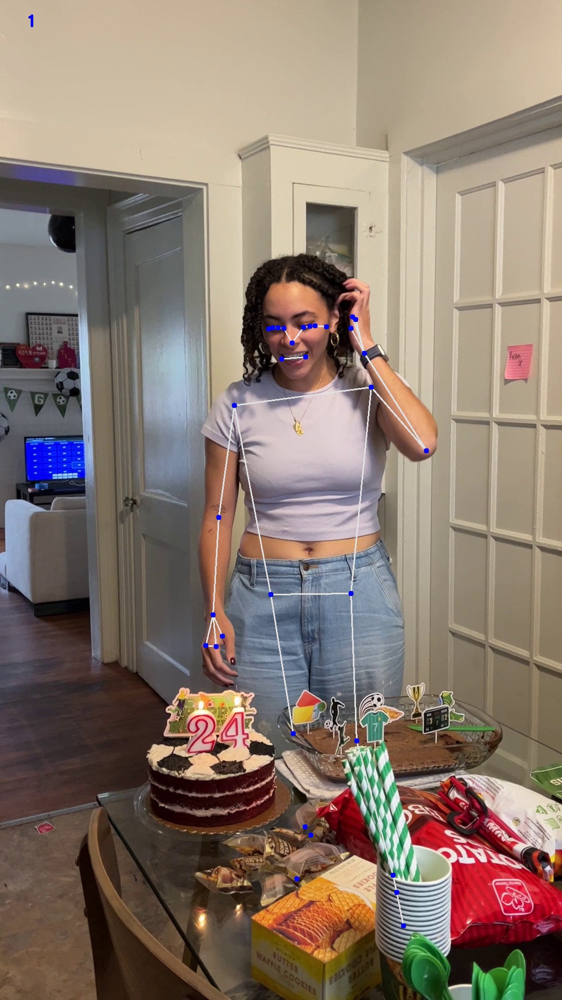

landmark {
  x: 0.5199922323226929
  y: 0.34146010875701904
  z: -0.39083901047706604
  visibility: 0.9999869465827942
}
landmark {
  x: 0.5393855571746826
  y: 0.325952410697937
  z: -0.37138843536376953
  visibility: 0.9999549388885498
}
landmark {
  x: 0.5511360168457031
  y: 0.3250742554664612
  z: -0.37146881222724915
  visibility: 0.999955952167511
}
landmark {
  x: 0.560108482837677
  y: 0.3243933320045471
  z: -0.37163951992988586
  visibility: 0.9999449253082275
}
landmark {
  x: 0.5049634575843811
  y: 0.327054500579834
  z: -0.3673185706138611
  visibility: 0.9999605417251587
}
landmark {
  x: 0.49458596110343933
  y: 0.3270789086818695
  z: -0.3672794997692108
  visibility: 0.9999566078186035
}
landmark {
  x: 0.4852280914783478
  y: 0.3270814120769501
  z: -0.36743518710136414
  visibility: 0.9999499917030334
}
landmark {
  x: 0.5808883905410767
  y: 0.32575520873069763
  z: -0.1857643574476242
  visibility: 0.9998838901519775
}
landmark {
  x: 0.47820141911506653
  y: 0.3

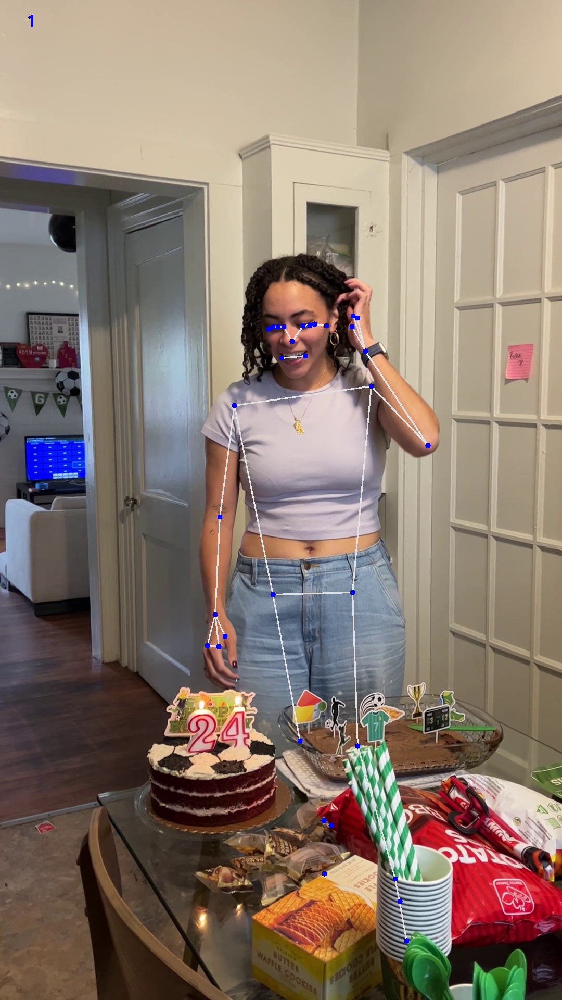

landmark {
  x: 0.5192180275917053
  y: 0.3413073420524597
  z: -0.41473621129989624
  visibility: 0.9999867677688599
}
landmark {
  x: 0.5380234122276306
  y: 0.32591694593429565
  z: -0.3990246653556824
  visibility: 0.9999534487724304
}
landmark {
  x: 0.5499923825263977
  y: 0.3250570595264435
  z: -0.39909690618515015
  visibility: 0.9999542832374573
}
landmark {
  x: 0.5593414902687073
  y: 0.324358195066452
  z: -0.3992525637149811
  visibility: 0.9999433755874634
}
landmark {
  x: 0.5041283965110779
  y: 0.3269878625869751
  z: -0.3930598199367523
  visibility: 0.9999600648880005
}
landmark {
  x: 0.4939667880535126
  y: 0.32702407240867615
  z: -0.39307257533073425
  visibility: 0.9999561905860901
}
landmark {
  x: 0.48483869433403015
  y: 0.3270445764064789
  z: -0.3932437598705292
  visibility: 0.999950110912323
}
landmark {
  x: 0.5805603265762329
  y: 0.32552292943000793
  z: -0.2178182154893875
  visibility: 0.9998794198036194
}
landmark {
  x: 0.47806549072265625
  y: 0.

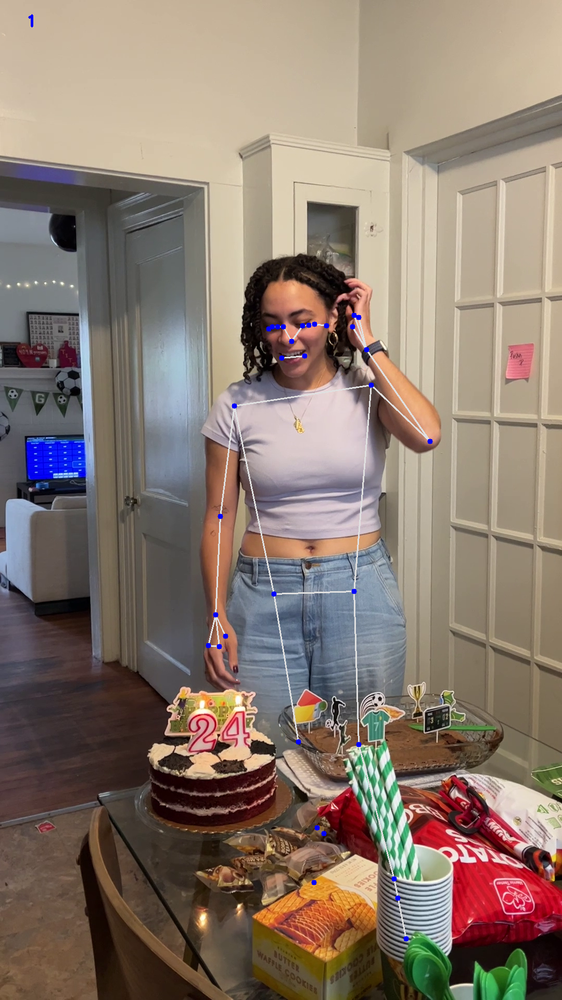

In [ ]:
import cv2
import mediapipe as mp
import time
mpPose = mp.solutions.pose
pose = mpPose.Pose()
mpDraw = mp.solutions.drawing_utils
from google.colab.patches import cv2_imshow

#cap = cv2.VideoCapture(0)
cap = cv2.VideoCapture('/content/IMG_7458.MOV')
pTime = 0

while True:
  success, img = cap.read()
  imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  results = pose.process(imgRGB)
  print(results.pose_landmarks)
  if results.pose_landmarks:
    mpDraw.draw_landmarks(img, results.pose_landmarks, mpPose.POSE_CONNECTIONS)
    for id, lm in enumerate(results.pose_landmarks.landmark):
      h, w,c = img.shape
      print(id, lm)
      cx, cy = int(lm.x*w), int(lm.y*h)
      cv2.circle(img, (cx, cy), 5, (255,0,0), cv2.FILLED)

  cTime = time.time()
  fps = 1/(cTime-pTime)
  pTime = cTime

  cv2.putText(img, str(int(fps)), (50,50), cv2.FONT_HERSHEY_SIMPLEX,1,(255,0,0), 3)
  cv2_imshow(img)
  cv2.waitKey(1)

In [36]:
import cv2
import numpy as np
import os
import csv
# from openpose import pyopenpose as op

# Function to extract joint positions from OpenPose output
def extract_joint_positions(output):
    joints = []
    for person in output['people']:
        keypoints = person['pose_keypoints_2d']
        joints.extend([(keypoints[i], keypoints[i+1]) for i in range(0, len(keypoints), 3)])
    return joints

# Function to process video using OpenPose and save joint positions to CSV
def process_video(video_path, output_csv):
    # Load OpenPose
    # try:
    #     from openpose import pyopenpose as op
    # except ImportError as e:
    #     print("Error: OpenPose library could not be found. Please make sure OpenPose is installed and properly configured.")
    #     return

    # Set OpenPose parameters
    params = {
        "model_folder": '/content/openpose/models',
        "disable_blending": True
    }

    # Create OpenPose instance
    opWrapper = op.WrapperPython()
    opWrapper.configure(params)
    opWrapper.start()

    # Open video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Failed to open video file.")
        return

    # Create CSV file for output
    with open(output_csv, 'w', newline='') as csvfile:
        fieldnames = ['Frame Number', 'Time (s)'] + [f'x{i} y{i}' for i in range(25)]
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

        frame_number = 0
        while True:
            ret, frame = cap.read()
            if not ret:
                break

            frame_number += 1
            t = cap.get(cv2.CAP_PROP_POS_MSEC) / 1000.0

            # Process frame with OpenPose
            datum = op.Datum()
            datum.cvInputData = frame
            opWrapper.emplaceAndPop([datum])

            # Extract joint positions
            joint_positions = extract_joint_positions(datum.poseKeypoints)

            # Write joint positions to CSV
            row = {
                'Frame Number': frame_number,
                'Time (s)': t
            }
            for i, (x, y) in enumerate(joint_positions):
                row[f'x{i} y{i}'] = f'{x} {y}'
            writer.writerow(row)

    # Release video capture and OpenPose
    cap.release()
    opWrapper.stop()

    print("Processing complete. CSV file saved:", output_csv)

# Example usage
if __name__ == "__main__":
    video_path = '/content/IMG_7458.MOV'
    output_csv = '/content/output.csv'
    process_video(video_path, output_csv)


AttributeError: module 'openpose' has no attribute 'WrapperPython'